In [1]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm
from glob import glob
import PIL.Image as Image
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.datasets as dset
import torchvision.utils as vutils
import cv2

In [17]:
import argparse
parser = argparse.ArgumentParser()
parser.add_argument('--n_epoch', type=int, default=200)
parser.add_argument('--batch_size', type=int, default=64)
# parser.add_argument('--batch_size', type=int, default=4)
parser.add_argument('--lr_g', type=float, default=1e-4)
parser.add_argument('--lr_d', type=float, default=4e-4)
# parser.add_argument('--nch_g', type=int, default=32)
# parser.add_argument('--nch_g', type=int, default=64)
parser.add_argument('--nch_g', type=int, default=128)
# parser.add_argument('--nch_d', type=int, default=32)
# parser.add_argument('--nch_d', type=int, default=64)
parser.add_argument('--nch_d', type=int, default=128)
parser.add_argument('--z_dim', type=int, default=100)
parser.add_argument('--beta1', type=float, default=0.0)
opt = parser.parse_args(args=[])
print(opt)

Namespace(batch_size=64, beta1=0.0, lr_d=0.0004, lr_g=0.0001, n_epoch=200, nch_d=128, nch_g=128, z_dim=100)


In [4]:
from torch.utils.data import Dataset
from PIL import ImageGrab

class ImageDataset(Dataset):
  def __init__(self, transform=None):
    super().__init__()
    self.file_list = glob('drive/MyDrive/Lung_Nodule/PickUp_img/*.jpg')
    self.transform = transform

  def __getitem__(self, index):
    if self.transform is not None:
      img = self.transform(Image.open(self.file_list[index]))
    else:
      img = Image.open(self.file_list[index])
    return img

  def __len__(self):
    return len(self.file_list)

In [5]:
class SelfAttention(nn.Module):
  def __init__(self, in_channels):
    super().__init__()
    out_channels = in_channels // 8
    self.fx_1x1 = nn.Conv2d(in_channels, out_channels, kernel_size=1)
    self.gx_1x1 = nn.Conv2d(in_channels, out_channels, kernel_size=1)
    self.hx_1x1 = nn.Conv2d(in_channels, in_channels, kernel_size=1)
    self.gamma = nn.Parameter(torch.zeros(1))
    self.softmax = nn.Softmax(dim=-2)

  def forward(self, x):
    B, C, H, W = x.size()
    # permuteは転置
    fx = self.fx_1x1(x).view(B, -1, H * W).permute(0, 2, 1)
    gx = self.gx_1x1(x).view(B, -1, H * W)
    hx = self.hx_1x1(x).view(B, -1, H * W)
    # bmmはバッチごとに行列積を計算　
    s_mtx = torch.bmm(fx, gx)
    attention = self.softmax(s_mtx)
    o = torch.bmm(hx, attention)
    o = o.view(B, -1, H, W)
    out = x + self.gamma * o
    return out

In [6]:
from torchvision.transforms.transforms import CenterCrop
import torchvision.transforms as transforms
transform = transforms.Compose([
                              #  transforms.Resize((32, 32)),
                               transforms.Resize((64, 64)),
                              # transforms.Resize((128, 128)),
                              #  transforms.CenterCrop(64),
                               transforms.ToTensor(),
                               transforms.Normalize(0.5, 0.5)
])

In [7]:
dataset = ImageDataset(transform=transform)
dataloader = DataLoader(dataset, batch_size=opt.batch_size, shuffle=True)
len(dataset), len(dataloader)

(561, 9)

In [8]:
import torch.nn as nn

# パラメータを初期化する関数を定義
def weights_init(m):
  # m.__class__.__name__ には、conv2などレイヤーの名前？がはいる。
  classname = m.__class__.__name__
  # classname にConvがあれば初期化をするということ。elifも同じ。
  if classname.find('Conv') != -1:
    nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm') != -1:
    nn.init.normal_(m.weight.data, 1.0, 0.02)
    nn.init.constant_(m.bias.data, 0)


In [ ]:
# # 画像サイズ128用

# class Generator2(nn.Module):
#   def __init__(self, self_attention, z_dim=100, ngf=64, nc=3):
#     super().__init__()   
#     # covnvt は転置畳み込み             
#     self.convt1 = self.conv_trans_layers(z_dim, 16 * ngf, 4, 1, 0, True)
#     self.convt2 = self.conv_trans_layers(16 * ngf, 8 * ngf, 4, 2, 1, True)
#     self.convt3 = self.conv_trans_layers(8 * ngf, 4 * ngf, 4, 2, 1, True)
#     self.attention1 = self_attention(4 * ngf)
#     self.convt4 = self.conv_trans_layers(4 * ngf, 2 * ngf, 4, 2, 1, True)
#     self.attention2 = self_attention(2 * ngf)
#     self.convt5 = self.conv_trans_layers(2 * ngf, ngf, 4, 2, 1, True)
#     self.attention3 = self_attention(ngf)
#     self.convt6 = nn.Sequential(
#         nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
#         nn.Tanh()
#     )

#   #　何回も書くのが面倒なので、メソッドを定義しておく。（上記で使用している。）
#   @staticmethod
#   def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm):
#     layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]

#     if has_norm:
#       layers.append(nn.BatchNorm2d(out_channels))
#     layers.append(nn.ReLU(inplace=True))
#     net = nn.Sequential(*layers)
#     return net

#   def forward(self, x):
#     out = self.convt1(x)
#     # print(out.shape)
#     out = self.convt2(out)
#     # print(out.shape)
#     out = self.convt3(out)
#     # print(out.shape)
#     out = self.attention1(out)
#     out = self.convt4(out)
#     out = self.attention2(out)
#     out = self.convt5(out)
#     out = self.attention3(out)
#     out = self.convt6(out)
#     return out
    

In [ ]:
# # 画像サイズ128用

# class Discriminator2(nn.Module):
#   def __init__(self, self_attention, nc=3, ndf=64):
#     super().__init__()
#     self.conv1 = self.conv_layers(nc, ndf)
#     self.conv2 = self.conv_layers(ndf, 2 * ndf)
#     self.conv3 = self.conv_layers(2 * ndf, 4 * ndf)
#     self.attention1 = self_attention(4 * ndf)
#     self.conv4 = self.conv_layers(4 * ndf, 8 * ndf)
#     self.attention2 = self_attention(8 * ndf)
#     self.conv5 = self.conv_layers(8 * ndf, 16 * ndf)
#     self.attention3 = self_attention(16 * ndf)
#     self.conv6 = nn.Conv2d(16 * ndf, 1, 4)

#   @staticmethod
#   def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, 
#                   has_batch_norm=False):
#     layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
#     if has_batch_norm :
#       layers.append(nn.BatchNorm2d(out_channels))
#     layers.append(nn.LeakyReLU(0.1, inplace=True))
#     net = nn.Sequential(*layers)
#     return net

#   def forward(self, x):
#     out = self.conv1(x)
#     # print(out.shape)
#     out = self.conv2(out)
#     # print(out.shape)
#     out = self.conv3(out)
#     # print(out.shape)
#     out = self.attention1(out)
#     out = self.conv4(out)
#     out = self.attention2(out)
#     out = self.conv5(out)
#     out = self.attention3(out)
#     out = self.conv6(out)
#     return out



In [ ]:
# # 画像サイズ32用
# class Generator(nn.Module):
#   def __init__(self, self_attention, z_dim=100, ngf=64, nc=1):
#     super().__init__()   
#     # covnvt は転置畳み込み             
#     self.convt1 = self.conv_trans_layers(z_dim, 8 * ngf, 4, 1, 0, True)
#     self.convt2 = self.conv_trans_layers(8 * ngf, 4 * ngf, 4, 2, 1, True)
#     self.attention1 = self_attention(4 * ngf)
#     self.convt3 = self.conv_trans_layers(4 * ngf, 2 * ngf, 4, 2, 1, True)
#     self.attention2 = self_attention(2 * ngf)
#     # self.convt4 = self.conv_trans_layers(2 * ngf, ngf, 4, 2, 1, True)
#     # self.attention2 = self_attention(ngf)
#     self.convt4 = nn.Sequential(
#         nn.ConvTranspose2d(2 * ngf, nc, 4, 2, 1),
#         nn.Tanh()
#     )

#   #　何回も書くのが面倒なので、メソッドを定義しておく。（上記で使用している。）
#   @staticmethod
#   def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm):
#     layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]

#     if has_norm:
#       layers.append(nn.BatchNorm2d(out_channels))
#     layers.append(nn.ReLU(inplace=True))
#     net = nn.Sequential(*layers)
#     return net

#   def forward(self, x):
#     out = self.convt1(x)
#     out = self.convt2(out)
#     out = self.attention1(out)
#     out = self.convt3(out)
#     out = self.attention2(out)
#     out = self.convt4(out)
#     print(out.shape)
#     return out
    

In [ ]:
# # 画像サイズ32用
# class Discriminator(nn.Module):
#   def __init__(self, self_attention, nc=1, ndf=64):
#     super().__init__()
#     self.conv1 = self.conv_layers(nc, ndf)
#     self.conv2 = self.conv_layers(ndf, 2 * ndf)
#     self.attention1 = self_attention(2 * ndf)
#     self.conv3 = self.conv_layers(2 * ndf, 4 * ndf)
#     # self.conv4 = self.conv_layers(4 * ndf, 8 * ndf)
#     self.attention2 = self_attention(4 * ndf)
#     self.conv4 = nn.Conv2d(4 * ndf, 1, 4)

#   @staticmethod
#   def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, 
#                   has_batch_norm=False):
#     layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
#     if has_batch_norm :
#       layers.append(nn.BatchNorm2d(out_channels))
#     layers.append(nn.LeakyReLU(0.1, inplace=True))
#     net = nn.Sequential(*layers)
#     return net

#   def forward(self, x):
#     out = self.conv1(x)
#     out = self.conv2(out)
#     out = self.attention1(out)
#     out = self.conv3(out)
#     out = self.attention2(out)
#     out = self.conv4(out)
#     return out


In [9]:
class Generator(nn.Module):
  def __init__(self, self_attention, z_dim=100, ngf=64, nc=1):
    super().__init__()   
    # covnvt は転置畳み込み             
    self.convt1 = self.conv_trans_layers(z_dim, 8 * ngf, 4, 1, 0, True)
    self.convt2 = self.conv_trans_layers(8 * ngf, 4 * ngf, 4, 2, 1, True)
    self.convt3 = self.conv_trans_layers(4 * ngf, 2 * ngf, 4, 2, 1, True)
    self.attention1 = self_attention(2 * ngf)
    self.convt4 = self.conv_trans_layers(2 * ngf, ngf, 4, 2, 1, True)
    self.attention2 = self_attention(ngf)
    self.convt5 = nn.Sequential(
        nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
        nn.Tanh()
    )

  #　何回も書くのが面倒なので、メソッドを定義しておく。（上記で使用。）
  @staticmethod
  def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm):
    layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]

    if has_norm:
      layers.append(nn.BatchNorm2d(out_channels))
    layers.append(nn.ReLU(inplace=True))
    net = nn.Sequential(*layers)
    return net

  def forward(self, x):
    out = self.convt1(x)
    # print(out.shape)
    out = self.convt2(out)
    # print(out.shape)
    out = self.convt3(out)
    # print(out.shape)
    out = self.attention1(out)
    out = self.convt4(out)
    out = self.attention2(out)
    out = self.convt5(out)
    return out
    

In [10]:
class Discriminator(nn.Module):
  def __init__(self, self_attention, nc=1, ndf=64):
    super().__init__()
    self.conv1 = self.conv_layers(nc, ndf)
    self.conv2 = self.conv_layers(ndf, 2 * ndf)
    self.conv3 = self.conv_layers(2 * ndf, 4 * ndf)
    self.attention1 = self_attention(4 * ndf)
    self.conv4 = self.conv_layers(4 * ndf, 8 * ndf)
    self.attention2 = self_attention(8 * ndf)
    self.conv5 = nn.Conv2d(8 * ndf, 1, 4)

  @staticmethod
  def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, 
                  has_batch_norm=False):
    layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
    if has_batch_norm :
      layers.append(nn.BatchNorm2d(out_channels))
    layers.append(nn.LeakyReLU(0.1, inplace=True))
    net = nn.Sequential(*layers)
    return net

  def forward(self, x):
    out = self.conv1(x)
    # print(out.shape)
    out = self.conv2(out)
    # print(out.shape)
    out = self.conv3(out)
    # print(out.shape)
    out = self.attention1(out)
    out = self.conv4(out)
    out = self.attention2(out)
    out = self.conv5(out)
    return out



In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
netG = Generator(self_attention=SelfAttention, z_dim=opt.z_dim, ngf=opt.nch_g).to(device)
# apply関数を使ってウェイトを初期化。
netG.apply(weights_init)
print(netG)

netD = Discriminator(self_attention=SelfAttention, nc=1, ndf=opt.nch_d).to(device)
netD.apply(weights_init)
print(netD)

In [13]:
# netG = Generator2(self_attention=SelfAttention, z_dim=opt.z_dim, ngf=opt.nch_g).to(device)
# # apply関数を使ってウェイトを初期化。
# netG.apply(weights_init)
# print(netG)

# netD = Discriminator2(self_attention=SelfAttention, nc=3, ndf=opt.nch_d).to(device)
# netD.apply(weights_init)
# print(netD)

In [14]:
# criterion = nn.BCELoss()

optimizerG = optim.Adam(netG.parameters(), lr=opt.lr_g, betas=(opt.beta1, 0.999), weight_decay=1e-5)
optimizerD = optim.Adam(netD.parameters(), lr=opt.lr_d, betas=(opt.beta1, 0.999), weight_decay=1e-5)


In [15]:
def save_params(file_path, epoch, netD, netG):
  torch.save(
      netG.state_dict(),
      file_path + '/g_{:04d}.pth'.format(epoch)
  )
  torch.save(
      netD.state_dict(),
      file_path + '/d_{:04d}.pth'.format(epoch)
  )

In [16]:
model_name = 'SAGAN'
f_path_result = 'drive/MyDrive/result/{}'.format(model_name)
f_path_params = 'drive/MyDrive/params/{}'.format(model_name)

os.makedirs(f_path_result, exist_ok=True)
os.makedirs(f_path_params, exist_ok=True)


100%|██████████| 9/9 [00:08<00:00,  1.02it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 0, lossD: 1.4097490244441562, lossG: 0.582897685882118


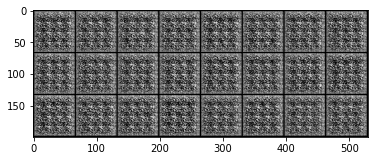

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 1, lossD: 1.241774593686892, lossG: 1.6527673515180747


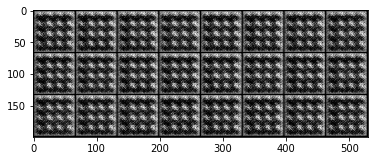

100%|██████████| 9/9 [00:03<00:00,  2.87it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 2, lossD: 1.1665537456671398, lossG: 0.8668055799272325


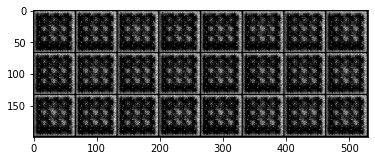

100%|██████████| 9/9 [00:03<00:00,  3.00it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 3, lossD: 1.0485227662656043, lossG: 1.3496454523669348


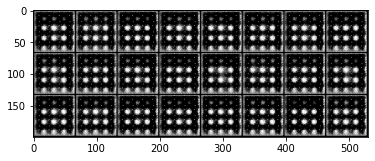

100%|██████████| 9/9 [00:02<00:00,  3.03it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 4, lossD: 1.0001662373542786, lossG: 1.0073003702693515


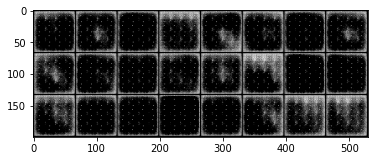

100%|██████████| 9/9 [00:02<00:00,  3.04it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 5, lossD: 1.299687021308475, lossG: 0.6940120284756025


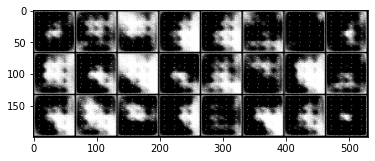

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 6, lossD: 1.4910318983925714, lossG: 0.4727168455719948


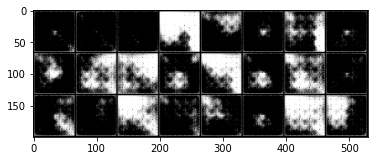

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 7, lossD: 1.839799960454305, lossG: 0.19448920753267077


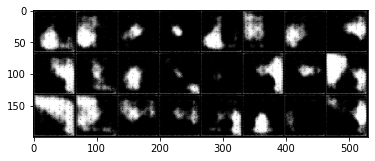

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 8, lossD: 1.9257124662399292, lossG: 0.3916931218571133


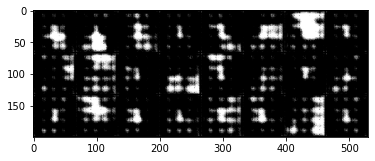

100%|██████████| 9/9 [00:02<00:00,  3.01it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 9, lossD: 1.8213636875152588, lossG: 0.3470529690384865


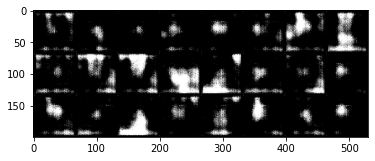

100%|██████████| 9/9 [00:02<00:00,  3.00it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 10, lossD: 1.8684902456071641, lossG: 0.6299576869027482


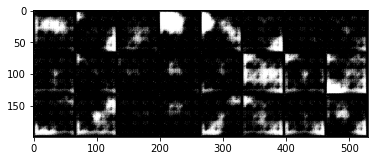

100%|██████████| 9/9 [00:02<00:00,  3.02it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 11, lossD: 1.8825392193264432, lossG: 0.6522508296701643


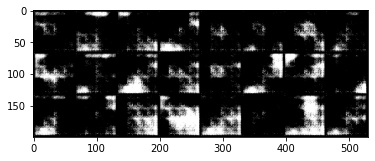

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 12, lossD: 1.7679170370101929, lossG: 0.3546059686276648


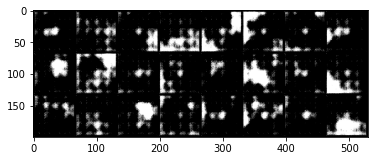

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 13, lossD: 1.7285728057225545, lossG: 0.4459320339891646


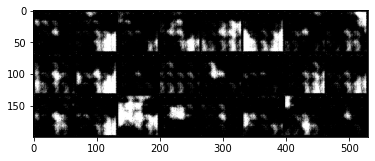

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 14, lossD: 1.7524036566416423, lossG: 0.5749792257944742


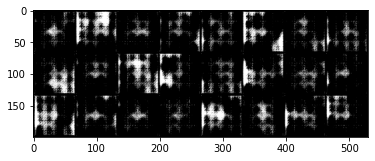

100%|██████████| 9/9 [00:02<00:00,  3.01it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 15, lossD: 1.4948811663521662, lossG: 0.8992947008874681


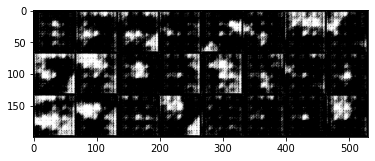

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 16, lossD: 1.5594796737035115, lossG: 0.806470877594418


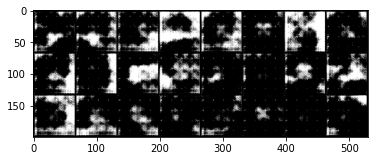

100%|██████████| 9/9 [00:02<00:00,  3.00it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 17, lossD: 1.4712140560150146, lossG: 0.8162200881375207


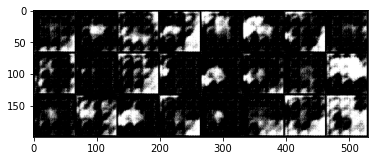

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 18, lossD: 1.3974386321173773, lossG: 0.9814333779116472


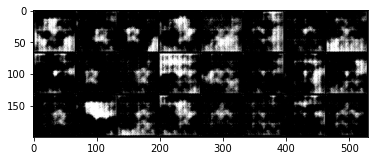

100%|██████████| 9/9 [00:03<00:00,  3.00it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 19, lossD: 1.4452147881189983, lossG: 1.0092548727989197


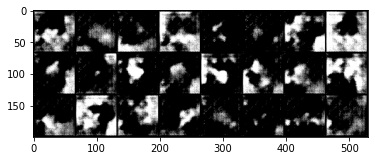

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 20, lossD: 1.5207262833913167, lossG: 0.7924197407232391


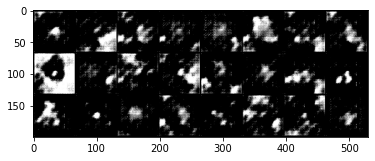

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 21, lossD: 1.480304479598999, lossG: 0.8130893541706933


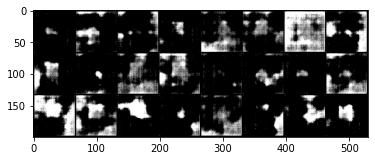

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 22, lossD: 1.3575953245162964, lossG: 1.1123157070639234


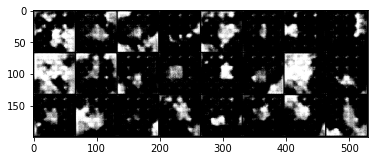

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 23, lossD: 1.5021549065907795, lossG: 0.928787092367808


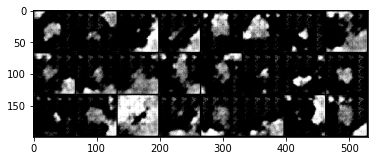

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 24, lossD: 1.3759231964747112, lossG: 1.0517248908678691


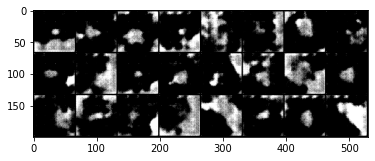

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 25, lossD: 1.282217025756836, lossG: 1.1282439654072125


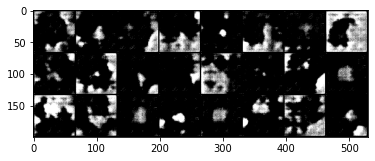

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 26, lossD: 1.250976324081421, lossG: 1.004254420598348


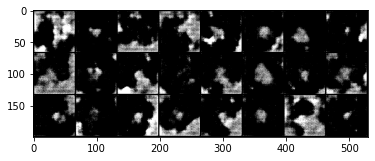

100%|██████████| 9/9 [00:02<00:00,  3.00it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 27, lossD: 1.4236399332682292, lossG: 1.110628479056888


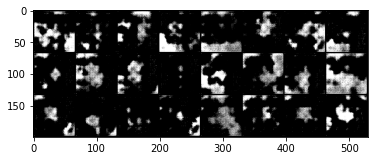

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 28, lossD: 1.2716582483715482, lossG: 1.022983870158593


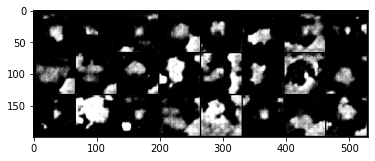

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 29, lossD: 1.1822257041931152, lossG: 1.172948294215732


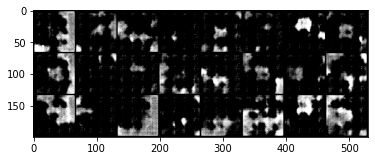

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 30, lossD: 1.1106510096126132, lossG: 1.0865218564867973


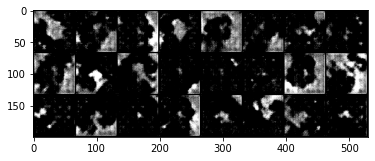

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 31, lossD: 1.2086503903071086, lossG: 1.2388956745465596


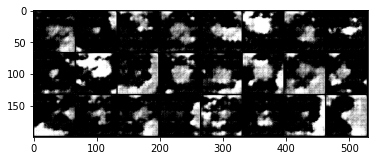

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 32, lossD: 1.0774271819326613, lossG: 1.3658009842038155


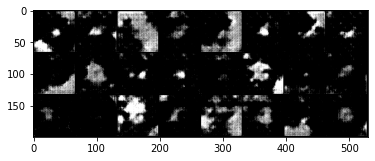

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 33, lossD: 0.9786876307593452, lossG: 1.1590456697675917


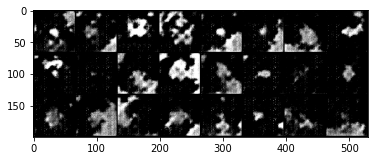

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 34, lossD: 1.0434807671440973, lossG: 1.4436324106322393


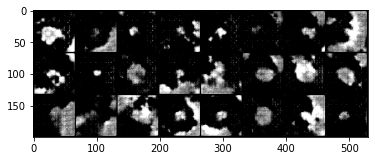

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 35, lossD: 0.9150243202845255, lossG: 1.1590358780490027


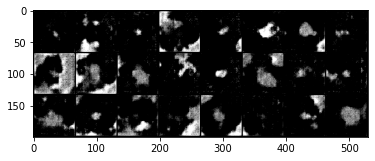

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 36, lossD: 0.9990955392519633, lossG: 1.3985897501309712


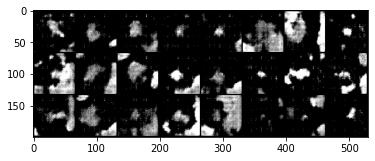

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 37, lossD: 0.9550953573650784, lossG: 1.2274452009134822


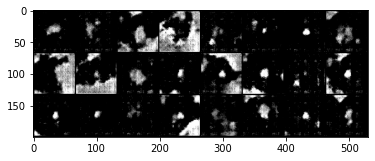

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 38, lossD: 0.8574270606040955, lossG: 1.1936611466937594


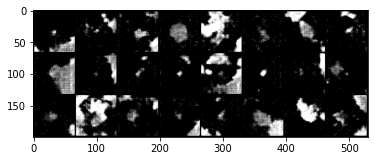

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 39, lossD: 0.8485335310300192, lossG: 1.2845254706011877


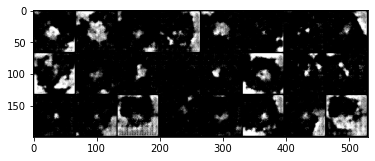

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 40, lossD: 0.9355720215373569, lossG: 1.3866184155146282


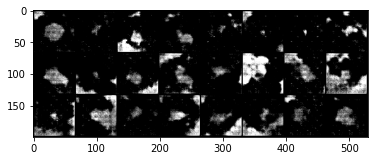

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 41, lossD: 0.8995868100060357, lossG: 1.2522104183832805


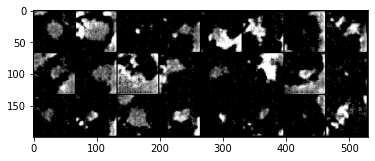

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 42, lossD: 0.7453262938393487, lossG: 1.6477216680844624


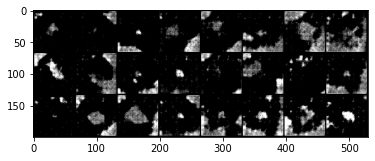

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 43, lossD: 0.8361290097236633, lossG: 1.4119832118352253


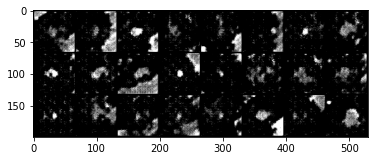

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 44, lossD: 0.7287252677811517, lossG: 1.470652891529931


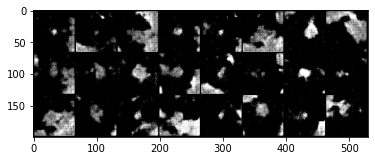

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 45, lossD: 0.8056487176153395, lossG: 1.5738838646146986


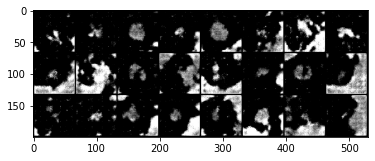

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 46, lossD: 0.7651221487257216, lossG: 1.3251258002387152


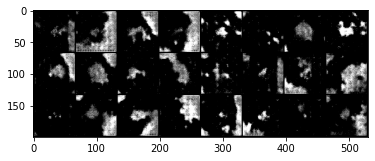

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 47, lossD: 0.6739315523041619, lossG: 1.5285312400923834


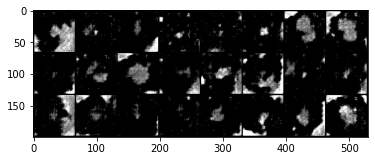

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 48, lossD: 0.6648099091317918, lossG: 1.4268435951736238


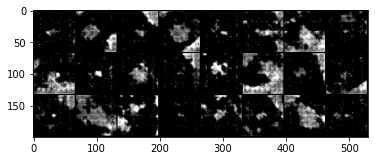

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 49, lossD: 0.696031477716234, lossG: 1.4967389305432637


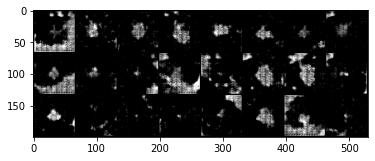

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 50, lossD: 0.5463019377655454, lossG: 1.7494711213641696


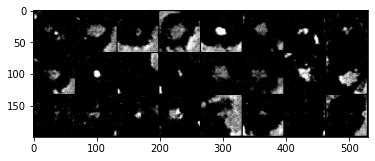

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 51, lossD: 0.5762118134233687, lossG: 1.4525321523348491


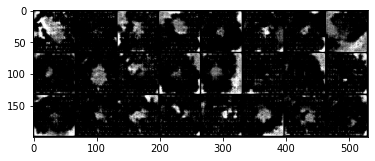

100%|██████████| 9/9 [00:02<00:00,  3.01it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 52, lossD: 0.7050674160321554, lossG: 1.6123059458202786


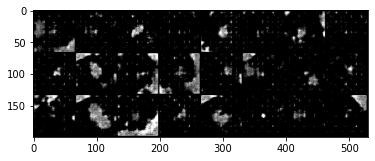

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 53, lossD: 0.631272574265798, lossG: 1.615012804667155


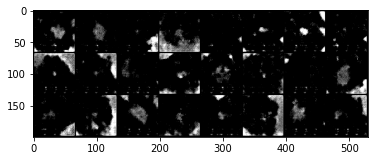

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 54, lossD: 0.528635624382231, lossG: 1.5906317962540522


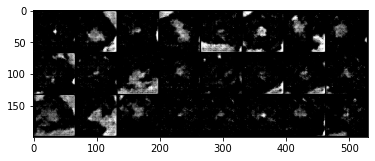

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 55, lossD: 0.5719563530551063, lossG: 1.6547664006551106


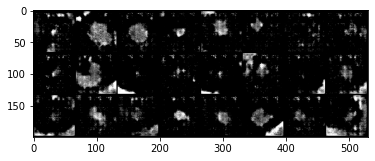

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 56, lossD: 0.6214677095413208, lossG: 1.631658262676663


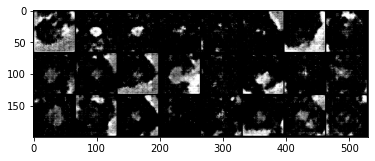

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 57, lossD: 0.41067418456077576, lossG: 1.7299014462365045


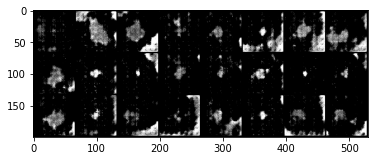

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 58, lossD: 0.4296007487508986, lossG: 1.50385891728931


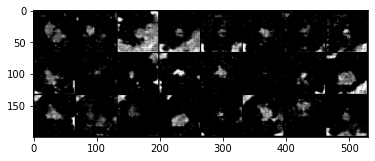

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 59, lossD: 0.4195176627900865, lossG: 1.552117109298706


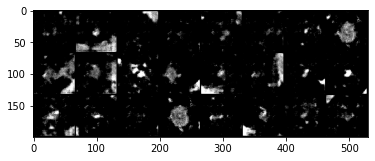

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 60, lossD: 0.440815054708057, lossG: 1.8047458198335435


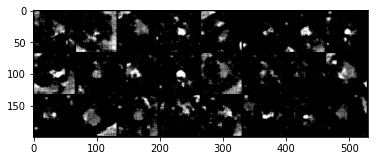

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 61, lossD: 0.4634390241569943, lossG: 1.793205115530226


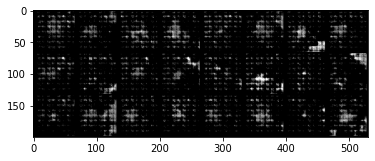

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 62, lossD: 0.4965204828315311, lossG: 1.7371046145757039


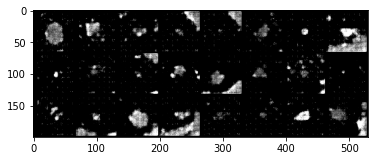

100%|██████████| 9/9 [00:02<00:00,  3.01it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 63, lossD: 0.3773128108845817, lossG: 1.6164131098323398


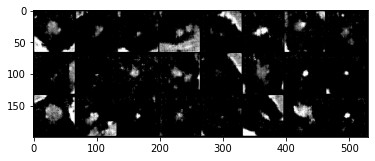

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 64, lossD: 0.41878020101123387, lossG: 1.9121842251883612


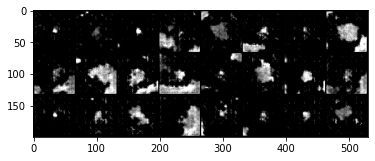

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 65, lossD: 0.457250005669064, lossG: 1.6731089618470933


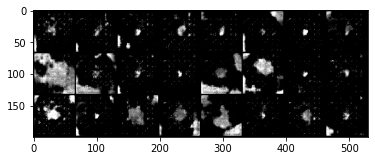

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 66, lossD: 0.3137082126405504, lossG: 1.5920980374018352


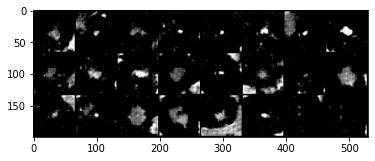

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 67, lossD: 0.4535410735342238, lossG: 1.6667995585335627


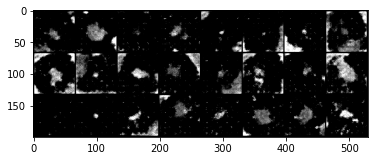

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 68, lossD: 0.3812403413984511, lossG: 1.7749917772081163


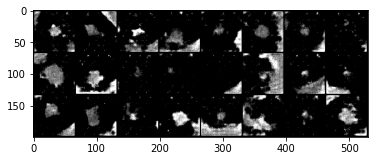

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 69, lossD: 0.31769878996743095, lossG: 1.7760714954800076


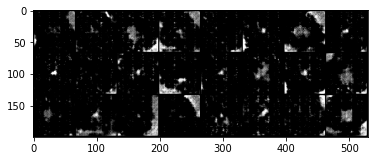

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 70, lossD: 0.44517384138372207, lossG: 1.7788791126675076


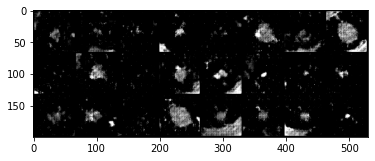

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 71, lossD: 0.35374107129044, lossG: 1.8566106292936537


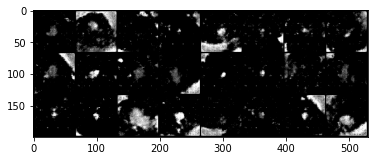

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 72, lossD: 0.402067459291882, lossG: 1.696964979171753


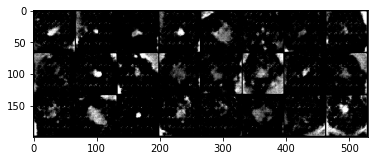

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 73, lossD: 0.3099616054031584, lossG: 1.7631211943096585


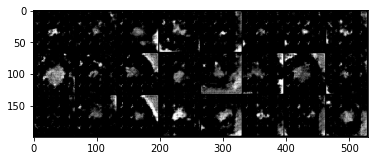

100%|██████████| 9/9 [00:03<00:00,  3.00it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 74, lossD: 0.2868967403968175, lossG: 1.5641025437249079


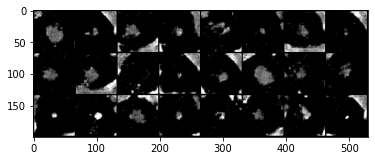

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 75, lossD: 0.3253655499882168, lossG: 1.8101974460813735


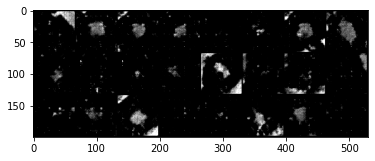

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 76, lossD: 0.28022611803478664, lossG: 1.700710071457757


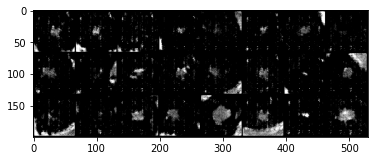

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 77, lossD: 0.4092925902869966, lossG: 1.8398592736985948


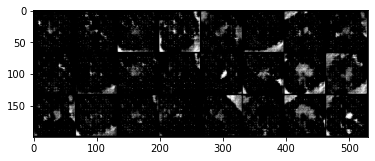

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 78, lossD: 0.28662528925471836, lossG: 1.6182618273629084


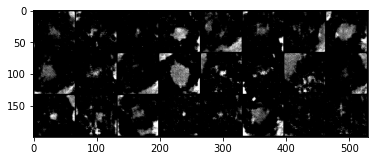

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 79, lossD: 0.2608979261583752, lossG: 1.7165838479995728


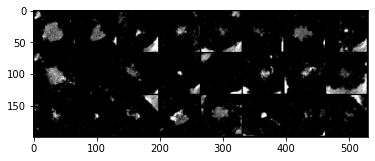

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 80, lossD: 0.3372597297032674, lossG: 1.7990261448754206


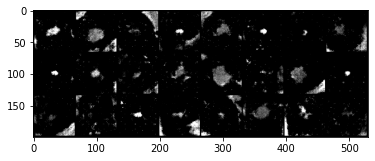

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 81, lossD: 0.2694357583920161, lossG: 1.711787634425693


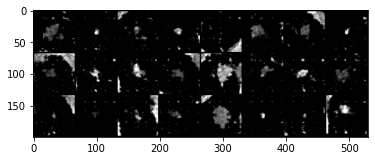

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 82, lossD: 0.3280162264903386, lossG: 1.9692691961924236


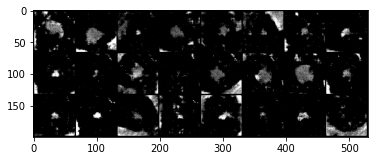

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 83, lossD: 0.291639056470659, lossG: 1.5963069730334811


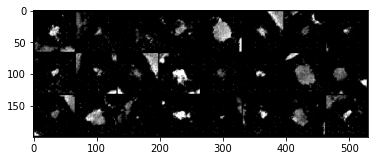

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 84, lossD: 0.2479588488737742, lossG: 1.7206761969460382


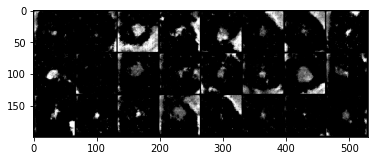

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 85, lossD: 0.27066689564122093, lossG: 1.8112028704749212


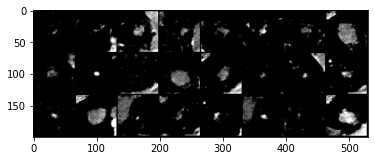

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 86, lossD: 0.3630054295063019, lossG: 1.763794634077284


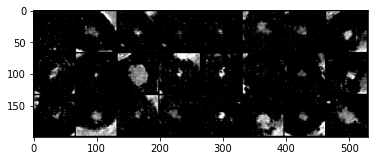

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 87, lossD: 0.2573024680217107, lossG: 1.6303450134065416


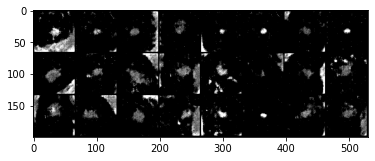

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 88, lossD: 0.21788629392782846, lossG: 1.7471021943622165


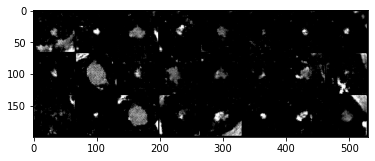

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 89, lossD: 0.18233199500375324, lossG: 1.56306172741784


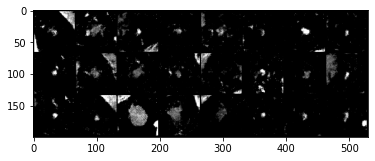

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 90, lossD: 0.23130920198228624, lossG: 1.734957496325175


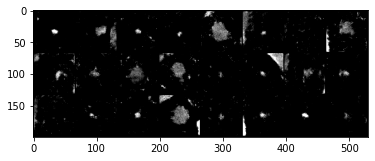

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 91, lossD: 0.2267248456676801, lossG: 1.7715939548280504


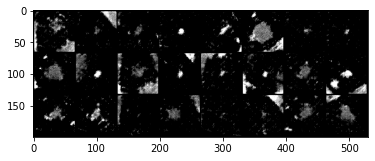

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 92, lossD: 0.44733599821726483, lossG: 1.8968930111991034


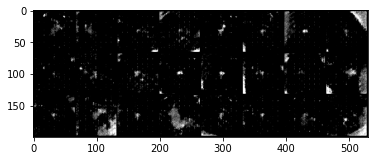

100%|██████████| 9/9 [00:03<00:00,  2.84it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 93, lossD: 0.2787616666820314, lossG: 1.8638126717673407


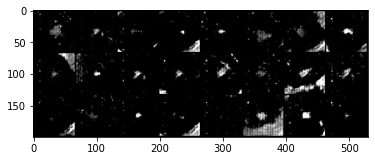

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 94, lossD: 0.22112558119826847, lossG: 1.666865388552348


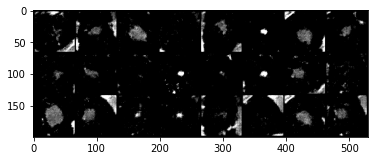

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 95, lossD: 0.18942821936474907, lossG: 1.7079151471455891


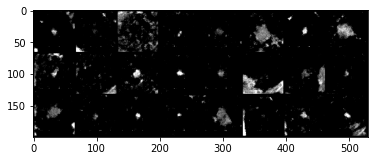

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 96, lossD: 0.2008110913965437, lossG: 1.6710888544718425


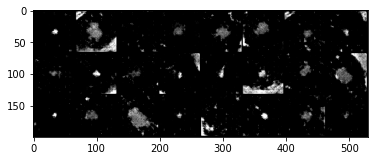

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 97, lossD: 0.28829406284623676, lossG: 1.7682918972439237


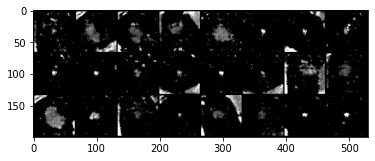

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 98, lossD: 0.22499645253022513, lossG: 1.8452797598308988


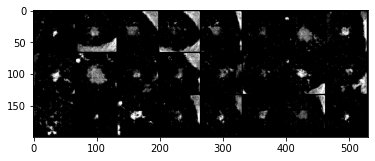

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 99, lossD: 0.18900647428300646, lossG: 1.7455115185843573


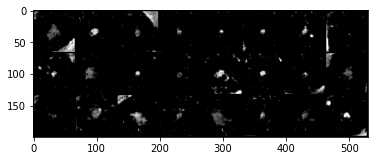

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 100, lossD: 0.15839705036746132, lossG: 1.7404848204718695


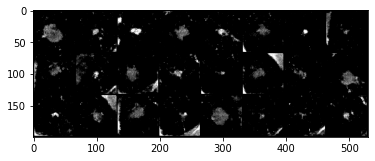

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 101, lossD: 0.2026299668682946, lossG: 1.7981955077913072


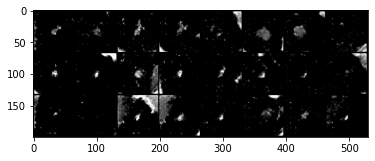

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 102, lossD: 0.3169685122039583, lossG: 1.8019384543100994


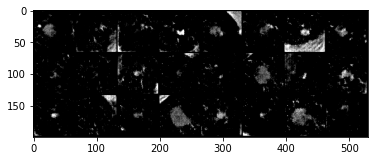

100%|██████████| 9/9 [00:03<00:00,  2.86it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 103, lossD: 0.20380507244004142, lossG: 1.5361707210540771


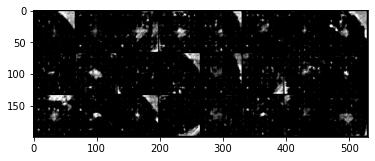

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 104, lossD: 0.17388495554526648, lossG: 1.7426548798878987


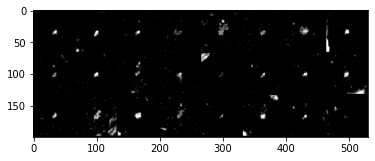

100%|██████████| 9/9 [00:03<00:00,  2.99it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 105, lossD: 0.14604911125368542, lossG: 1.537378774748908


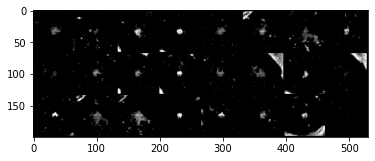

100%|██████████| 9/9 [00:03<00:00,  2.87it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 106, lossD: 0.14667351129982206, lossG: 1.8931123150719538


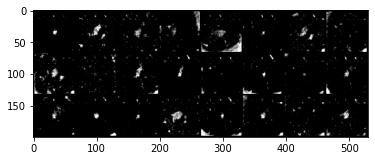

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 107, lossD: 0.14890478385819328, lossG: 1.6474127637015448


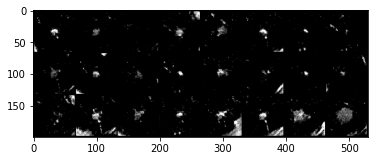

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 108, lossD: 0.1335058824883567, lossG: 1.7474510934617784


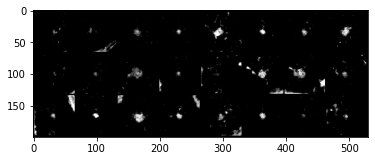

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 109, lossD: 0.1659977494014634, lossG: 1.824587689505683


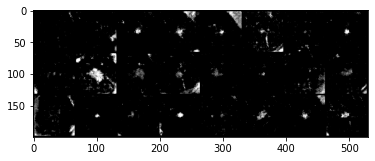

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 110, lossD: 0.15876297652721405, lossG: 1.8771819273630779


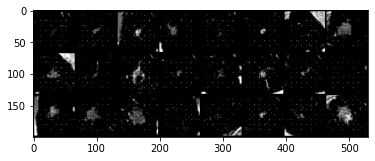

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 111, lossD: 0.12334971709383859, lossG: 1.5976487000783284


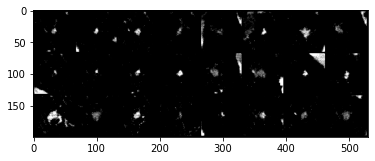

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 112, lossD: 0.12613531750523382, lossG: 1.6102704604466755


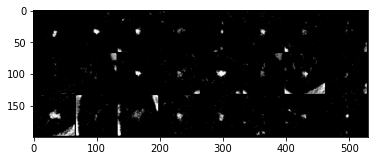

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 113, lossD: 0.17380111664533615, lossG: 1.8376377556059096


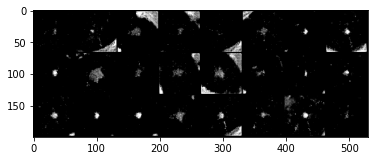

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 114, lossD: 0.13371114267243278, lossG: 1.4888182216220431


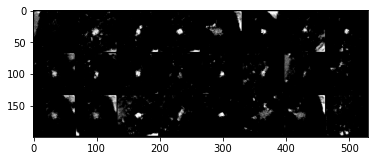

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 115, lossD: 0.12199772977166706, lossG: 1.4652787182066176


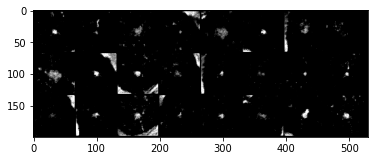

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 116, lossD: 0.12003218341204855, lossG: 1.893151707119412


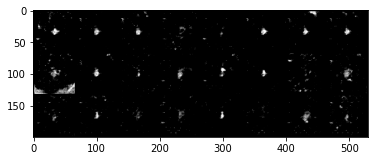

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 117, lossD: 0.10294668583406343, lossG: 1.6511417892244127


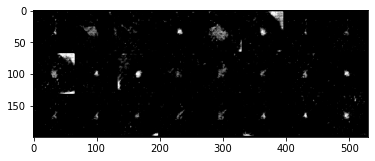

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 118, lossD: 0.12326763777269258, lossG: 1.7687546412150066


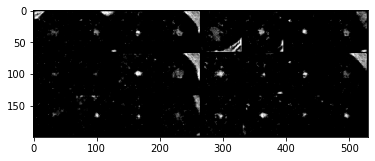

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 119, lossD: 0.13157910563879543, lossG: 1.5559052626291912


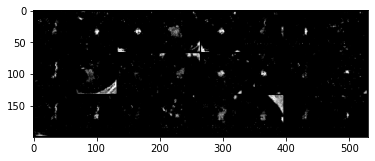

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 120, lossD: 0.12413644252551927, lossG: 1.8748457431793213


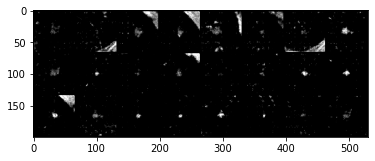

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 121, lossD: 0.12397097175319989, lossG: 1.564333928955926


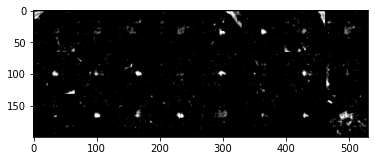

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 122, lossD: 0.126000528741214, lossG: 1.6349138021469116


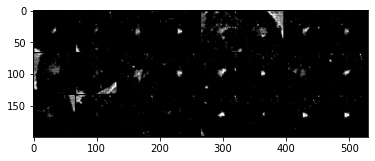

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 123, lossD: 0.09237014792031711, lossG: 1.4612405167685614


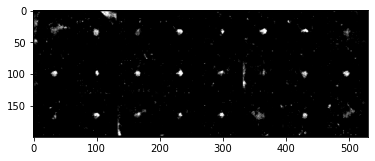

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 124, lossD: 0.13952715074022612, lossG: 1.8728786574469671


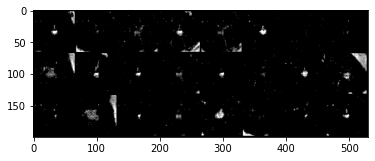

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 125, lossD: 0.10244587229357825, lossG: 1.6183072196112738


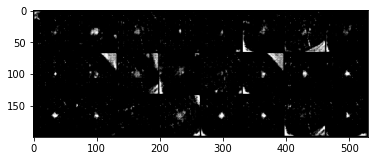

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 126, lossD: 0.09968527882463402, lossG: 1.5443044768439398


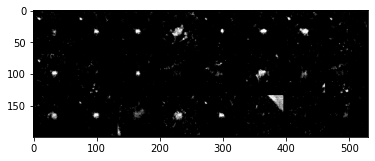

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 127, lossD: 0.09920089019255506, lossG: 1.3897967338562012


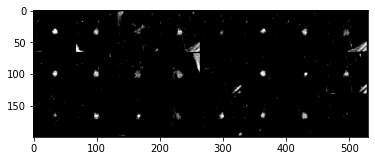

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 128, lossD: 0.12115755822095606, lossG: 1.8166922860675387


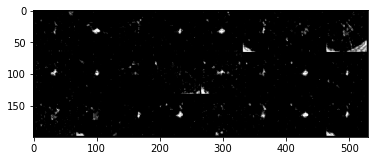

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 129, lossD: 0.10423214609424274, lossG: 1.7000550031661987


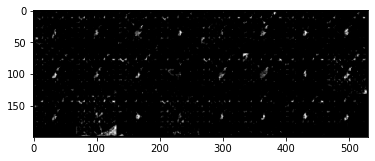

100%|██████████| 9/9 [00:03<00:00,  2.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 130, lossD: 0.08950643717414802, lossG: 1.4791349569956462


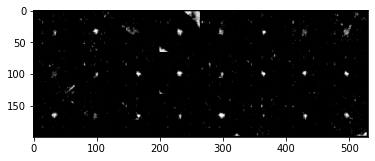

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 131, lossD: 0.07716675847768784, lossG: 1.3970753881666396


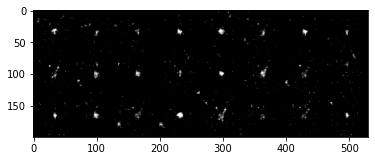

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 132, lossD: 0.08238696969217724, lossG: 1.5692663060294256


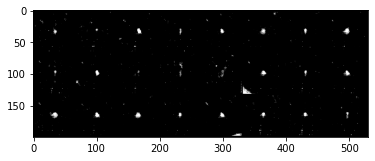

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 133, lossD: 0.09483318734500143, lossG: 1.6382723781797621


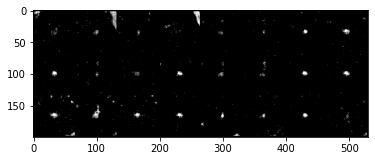

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 134, lossD: 0.08180594920284218, lossG: 1.4908498260709975


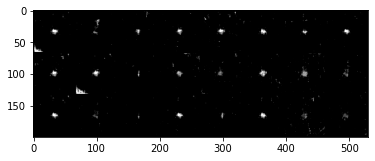

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 135, lossD: 0.07947567933135563, lossG: 1.6737339231703017


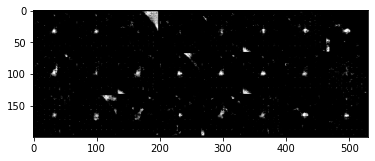

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 136, lossD: 0.09933578264382151, lossG: 1.5462069378958807


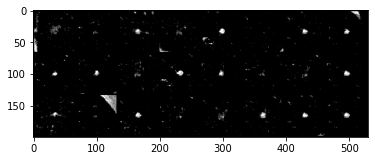

100%|██████████| 9/9 [00:03<00:00,  2.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 137, lossD: 0.08063713254200087, lossG: 1.4455511834886339


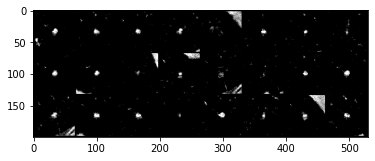

100%|██████████| 9/9 [00:03<00:00,  3.00it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 138, lossD: 0.0831183675262663, lossG: 1.5915336608886719


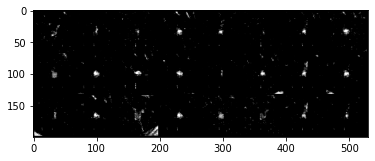

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 139, lossD: 0.09437768037120502, lossG: 2.1204192373487682


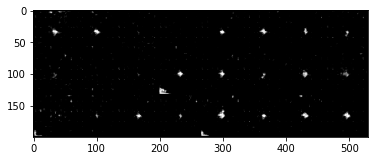

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 140, lossD: 0.11454984173178673, lossG: 1.5664116541544597


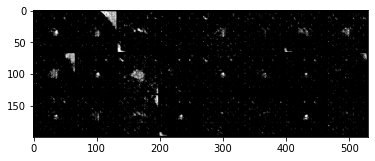

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 141, lossD: 0.09883838478061888, lossG: 1.575138250986735


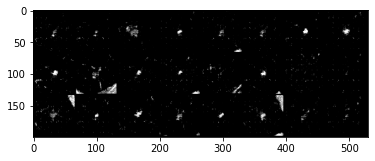

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 142, lossD: 0.0894270342671209, lossG: 1.4855465756522284


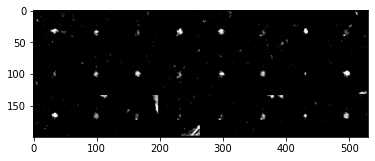

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 143, lossD: 0.1194761192633046, lossG: 1.7917826705508761


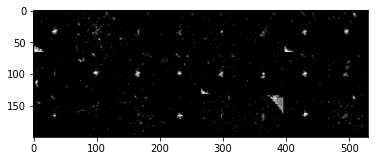

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 144, lossD: 0.09351644623610708, lossG: 1.3512602117326524


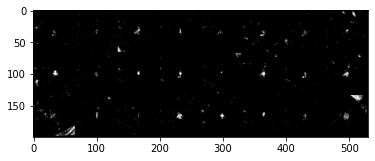

100%|██████████| 9/9 [00:03<00:00,  2.86it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 145, lossD: 0.07629058447976907, lossG: 1.3299024767345853


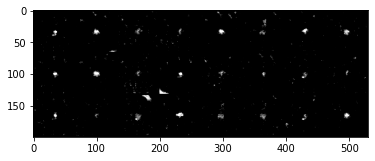

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 146, lossD: 0.10173388011753559, lossG: 1.9804905785454645


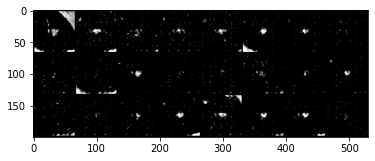

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 147, lossD: 0.10044282426436742, lossG: 1.5527735418743558


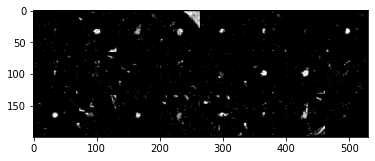

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 148, lossD: 0.08826884875694911, lossG: 1.538791537284851


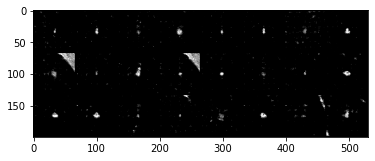

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 149, lossD: 0.0810048362861077, lossG: 1.4262423250410292


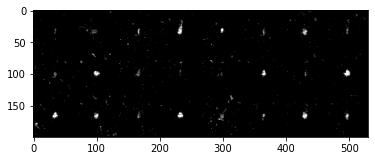

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 150, lossD: 0.07886749278340074, lossG: 1.4791073931588068


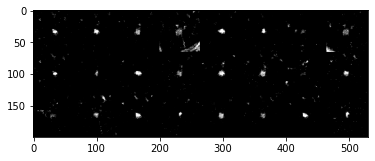

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 151, lossD: 0.07850589251352681, lossG: 1.4708636071946886


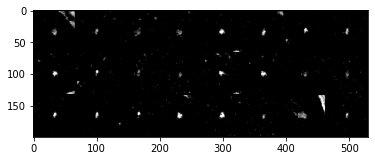

100%|██████████| 9/9 [00:03<00:00,  2.78it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 152, lossD: 0.08551422682487303, lossG: 1.4392626815372043


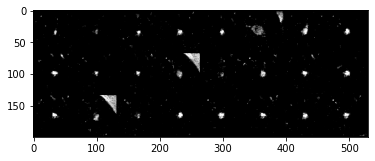

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 153, lossD: 0.09483400028612879, lossG: 1.59726881980896


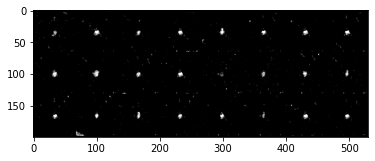

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 154, lossD: 0.08047910572754012, lossG: 1.5114788081910875


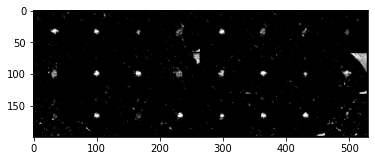

100%|██████████| 9/9 [00:03<00:00,  2.87it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 155, lossD: 0.08682373414436977, lossG: 1.6623610787921481


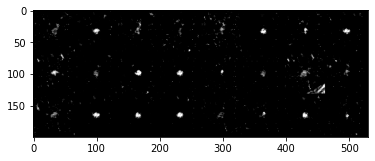

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 156, lossD: 0.07529210547606151, lossG: 1.4296567307578192


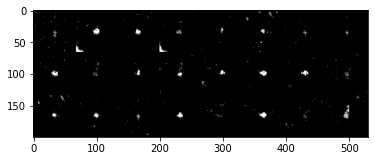

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 157, lossD: 0.09011368877771828, lossG: 1.893701606326633


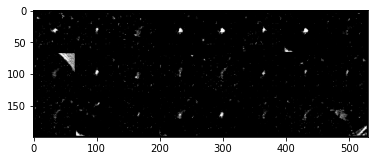

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 158, lossD: 0.07818372837371296, lossG: 1.401452488369412


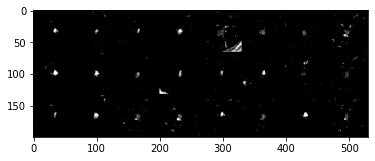

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 159, lossD: 0.07613153476268053, lossG: 1.5659311479992337


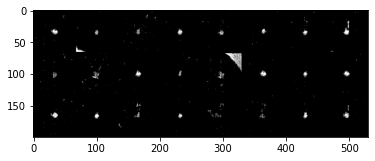

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 160, lossD: 0.06323035413192378, lossG: 1.433091362317403


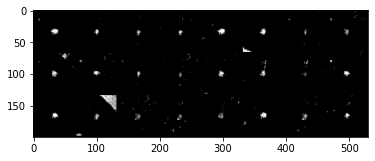

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 161, lossD: 0.07325196514527003, lossG: 1.4705218871434529


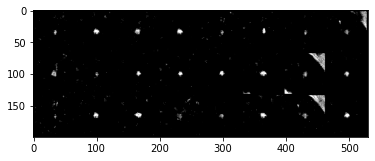

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 162, lossD: 0.09206646680831909, lossG: 1.8094494475258722


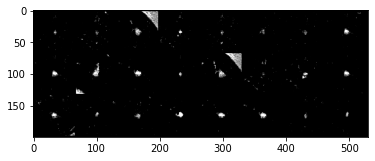

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 163, lossD: 0.07686970031095876, lossG: 1.3842790656619601


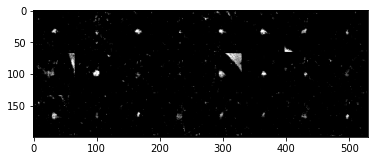

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 164, lossD: 1.313245274954372, lossG: 1.5989672674073114


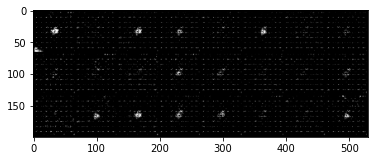

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 165, lossD: 1.2092504302660625, lossG: 0.8761714992837774


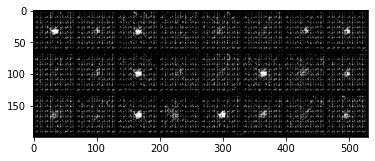

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 166, lossD: 0.6567642754978604, lossG: 1.1353040999836392


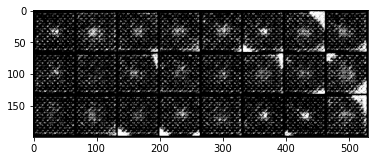

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 167, lossD: 1.1831613183021545, lossG: 1.0267454650666978


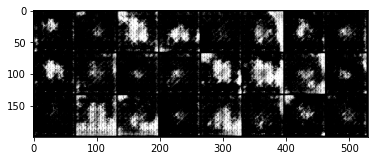

100%|██████████| 9/9 [00:03<00:00,  2.84it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 168, lossD: 1.5630032618840535, lossG: 0.8848879337310791


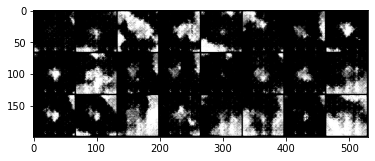

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 169, lossD: 1.4010181427001953, lossG: 0.942496140797933


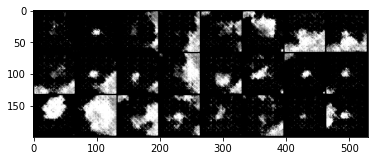

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 170, lossD: 1.0510510404904683, lossG: 1.1572516825464036


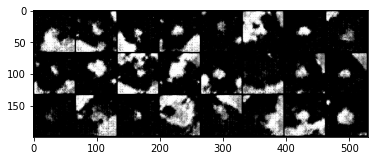

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 171, lossD: 0.8216230273246765, lossG: 1.2742262482643127


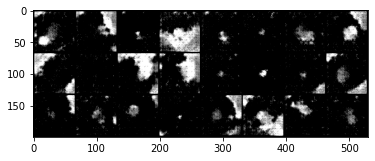

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 172, lossD: 0.6285049385494657, lossG: 1.4290925992859735


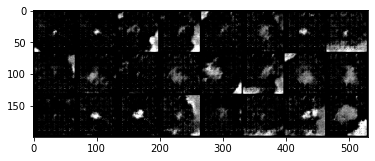

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 173, lossD: 0.4529725710550944, lossG: 1.6375176045629714


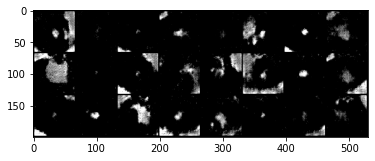

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 174, lossD: 0.39847104748090106, lossG: 1.6933159165912204


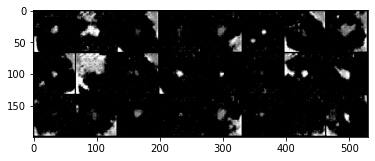

100%|██████████| 9/9 [00:03<00:00,  2.80it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 175, lossD: 0.2804728498061498, lossG: 1.6998759243223402


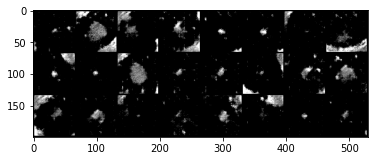

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 176, lossD: 0.2816341304116779, lossG: 1.766434563530816


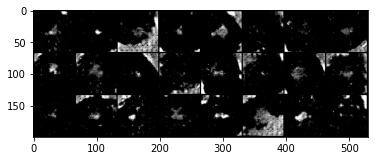

100%|██████████| 9/9 [00:03<00:00,  2.87it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 177, lossD: 0.2128877341747284, lossG: 1.6270097759034898


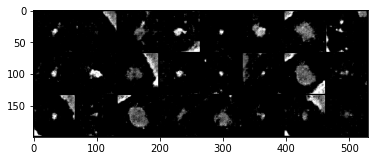

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 178, lossD: 0.4202193137672212, lossG: 1.9908009767532349


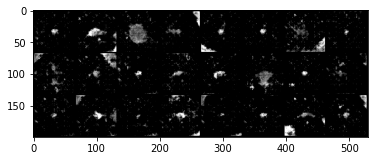

100%|██████████| 9/9 [00:03<00:00,  2.90it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 179, lossD: 0.22783830679125255, lossG: 1.7918980518976848


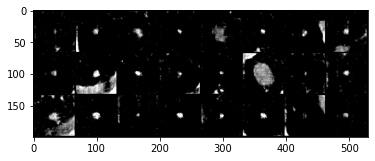

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 180, lossD: 0.23774324523078072, lossG: 1.595433579550849


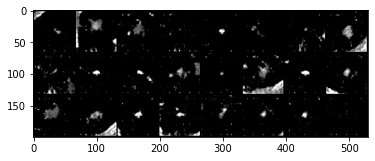

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 181, lossD: 0.1757375631067488, lossG: 1.7130383385552301


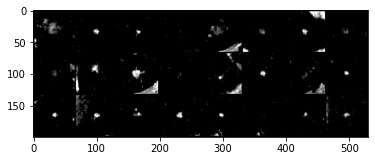

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 182, lossD: 0.1538940684662925, lossG: 1.7280158996582031


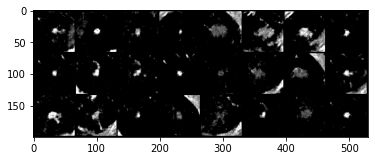

100%|██████████| 9/9 [00:03<00:00,  2.91it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 183, lossD: 0.18130369981129965, lossG: 1.6043529510498047


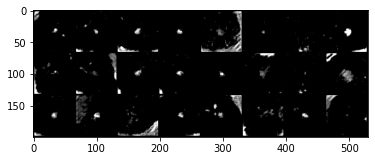

100%|██████████| 9/9 [00:03<00:00,  2.87it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 184, lossD: 0.15266728483968312, lossG: 1.7719013690948486


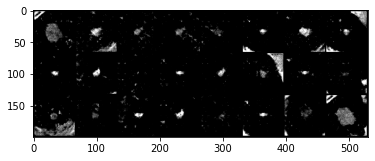

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 185, lossD: 0.12387072957224315, lossG: 1.5952583418952093


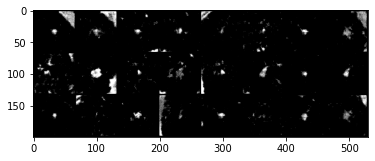

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 186, lossD: 0.11923226714134216, lossG: 1.7191227144665189


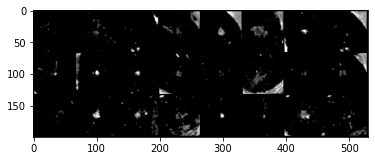

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 187, lossD: 0.11505833102597131, lossG: 1.5870717498991225


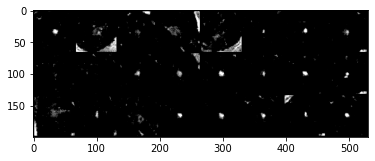

100%|██████████| 9/9 [00:03<00:00,  2.85it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 188, lossD: 0.13503124564886093, lossG: 1.6037228902180989


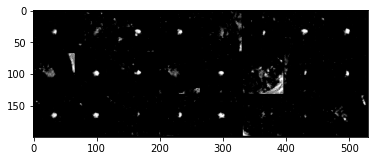

100%|██████████| 9/9 [00:03<00:00,  2.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 189, lossD: 0.10067402364479171, lossG: 1.5883255534701877


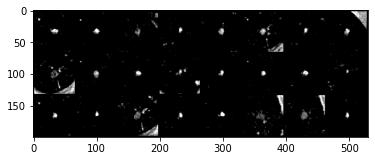

100%|██████████| 9/9 [00:03<00:00,  2.94it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 190, lossD: 0.11706437832779354, lossG: 1.6794262064827814


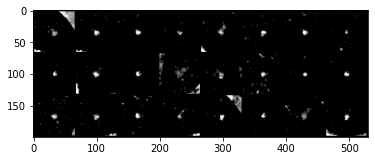

100%|██████████| 9/9 [00:03<00:00,  2.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 191, lossD: 0.09371218416425917, lossG: 1.4663639201058283


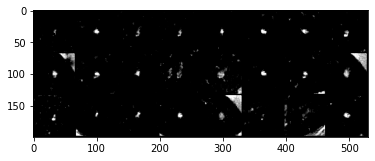

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 192, lossD: 0.08751410370071729, lossG: 1.5568990177578397


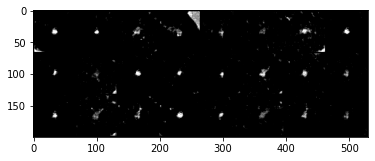

100%|██████████| 9/9 [00:03<00:00,  2.87it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 193, lossD: 0.09090915146387285, lossG: 1.5754708184136286


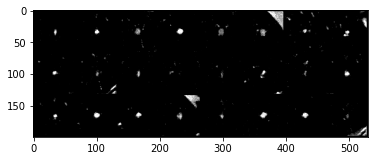

100%|██████████| 9/9 [00:03<00:00,  2.89it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 194, lossD: 0.08301486116316584, lossG: 1.5092558330959744


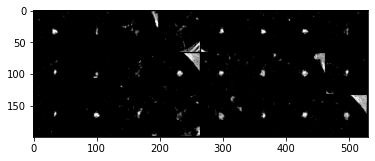

100%|██████████| 9/9 [00:03<00:00,  2.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 195, lossD: 0.08413257863786486, lossG: 1.4301040305031671


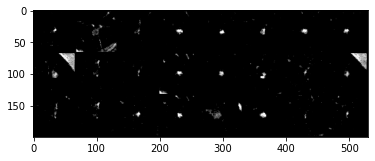

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 196, lossD: 0.08477382320496771, lossG: 1.5331141153971355


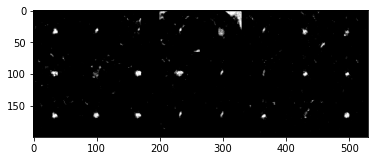

100%|██████████| 9/9 [00:03<00:00,  2.96it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 197, lossD: 0.0741722374740574, lossG: 1.4739180670844183


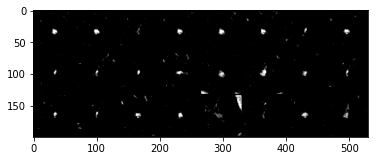

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 198, lossD: 0.08370763767096731, lossG: 1.4632156822416518


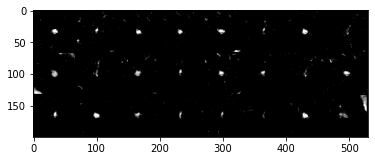

100%|██████████| 9/9 [00:03<00:00,  2.87it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


epoch: 199, lossD: 0.09588073773516549, lossG: 1.6707343525356717


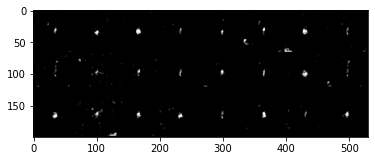

In [18]:
lossesD = []
lossesG = []
raw_lossesD = []
raw_lossesG = []
relu = torch.nn.ReLU()

for epoch in range(opt.n_epoch):
  running_lossD = 0.0
  running_lossG = 0.0
  for i, real_imgs in enumerate(tqdm.tqdm(dataloader, position=0)):
    real_imgs = real_imgs.to(device)
    # 最後のdataloaderバッチサイズは指定したバッチサイズにならないので,毎回バッチサイズを取得。
    batch_size = real_imgs.size()[0]
    noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

    # train Discriminator
    netD.zero_grad()
    output = netD(real_imgs)
    # lossD_real = criterion(output, labels_real)
    # lossをヒンジ損失へ
    lossD_real = torch.mean(relu(1.0 - output))

    fake_imgs = netG(noise)
    # 識別機を訓練する際は、Generatorは更新しない。detachでfakeimgsを切り離す。
    output = netD(fake_imgs.detach())
    # lossD_fake = criterion(output, labels_fake)
    lossD_fake = torch.mean(relu(1.0 + output))

    lossD = lossD_real + lossD_fake
    lossD.backward()
    optimizerD.step()


    # train Generaator
    netG.zero_grad()
    output = netD(fake_imgs)
    # lossG = criterion(output, labels_real)
    lossG = -torch.mean(output)
    lossG.backward()
    optimizerG.step()


    # save losses
    running_lossD += lossD.item()
    running_lossG += lossG.item()
    raw_lossesD.append(lossD.item())
    raw_lossesG.append(lossG.item())
  running_lossD /= len(dataloader)
  running_lossG /= len(dataloader)
  print('epoch: {}, lossD: {}, lossG: {}'.format(epoch, running_lossD, running_lossG))
  lossesD.append(running_lossD)
  lossesG.append(running_lossG)


  # show fake imgs
  # 24枚の画像を取ってきている。
  # 0.5で明るさを調整している。
  grid_imgs = vutils.make_grid(fake_imgs[:24].detach() + 0.5)
  grid_imgs_arr = grid_imgs.cpu().numpy()
  plt.imshow(np.transpose(grid_imgs_arr, (1, 2, 0)))
  plt.show()

  # save imgs & parameters
  # 0.5で明るさを調整している。
  vutils.save_image(fake_imgs + 0.5, f_path_result + '/{}.jpg'.format(epoch))
  if epoch % 50 == 0:
    save_params(f_path_params, epoch, netD, netG)



Text(0.5, 1.0, 'lossG')

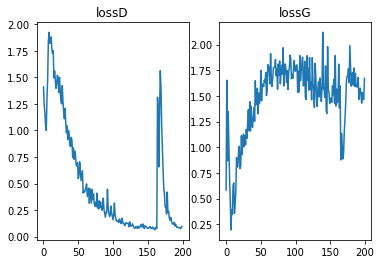

In [20]:
fig, ax = plt.subplots(1,2)
ax[0].plot(lossesD)
ax[0].set_title('lossD')
ax[1].plot(lossesG)
ax[1].set_title('lossG')

In [22]:
# モデルをロード
state_g = torch.load('drive/MyDrive/params/SAGAN/g_0100.pth')
state_d = torch.load('drive/MyDrive/params/SAGAN/d_0100.pth')
netG.load_state_dict(state_g)
netD.load_state_dict(state_d)


<All keys matched successfully>

In [ ]:
noise = torch.randn(64, 100, 1, 1).to(device)
fake_imgs = netG(noise)
fake_imgs.shape

torch.Size([64, 1, 64, 64])

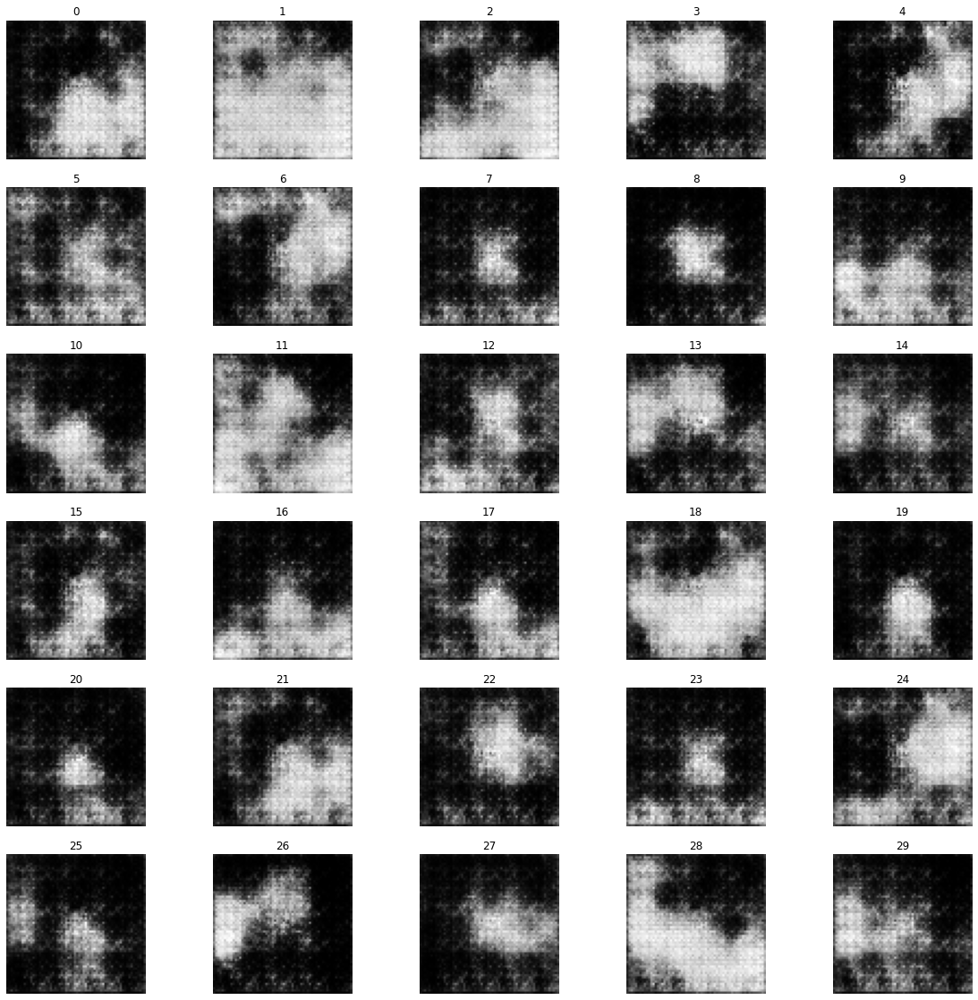

In [ ]:
# fake画像を一覧表示。
# ここから合成に使えそうな腫瘍画像を選んで、ポアソン合成をする。
fake_imgs = fake_imgs.detach().to('cpu').numpy().squeeze()
fig, ax = plt.subplots(6, 5, figsize=(20, 20))
for i in range(30):
  ax[i//5, i%5].imshow(fake_imgs[i], cmap='gray')
  ax[i//5, i%5].axis('off')
  ax[i//5, i%5].set_title('{}'.format(i))

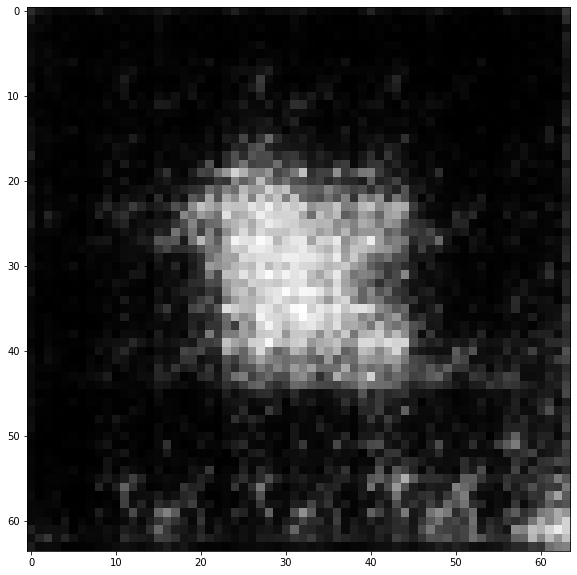

In [ ]:
# 上記から表示したい画像を選択.
idx = 8
fake_img = fake_imgs[idx]
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(fake_img, cmap='gray')

In [ ]:
# # 上記画像から切り取るサイズを選択し、マスク画像を生成。.
# x_min = 12
# x_max = 50
# y_min = 8
# y_max = 54
# H, W = fake_img.shape
# mask_img = np.zeros((H, W))
# mask_img[y_min:y_max, x_min:x_max] = 255
# mask_img = mask_img.astype(np.uint8)

In [ ]:
# fake_imgの画素値を0~255へ、リレンジ
ma = fake_img.max()
mi = fake_img.min()

fake_img = (fake_img - mi) / (ma - mi) * 255
fake_img = fake_img.astype(np.uint8)

In [ ]:
num = 2
Image.fromarray(fake_img).save('drive/MyDrive/GAN_Cancer/fake_img_{}.jpg'.format(num))

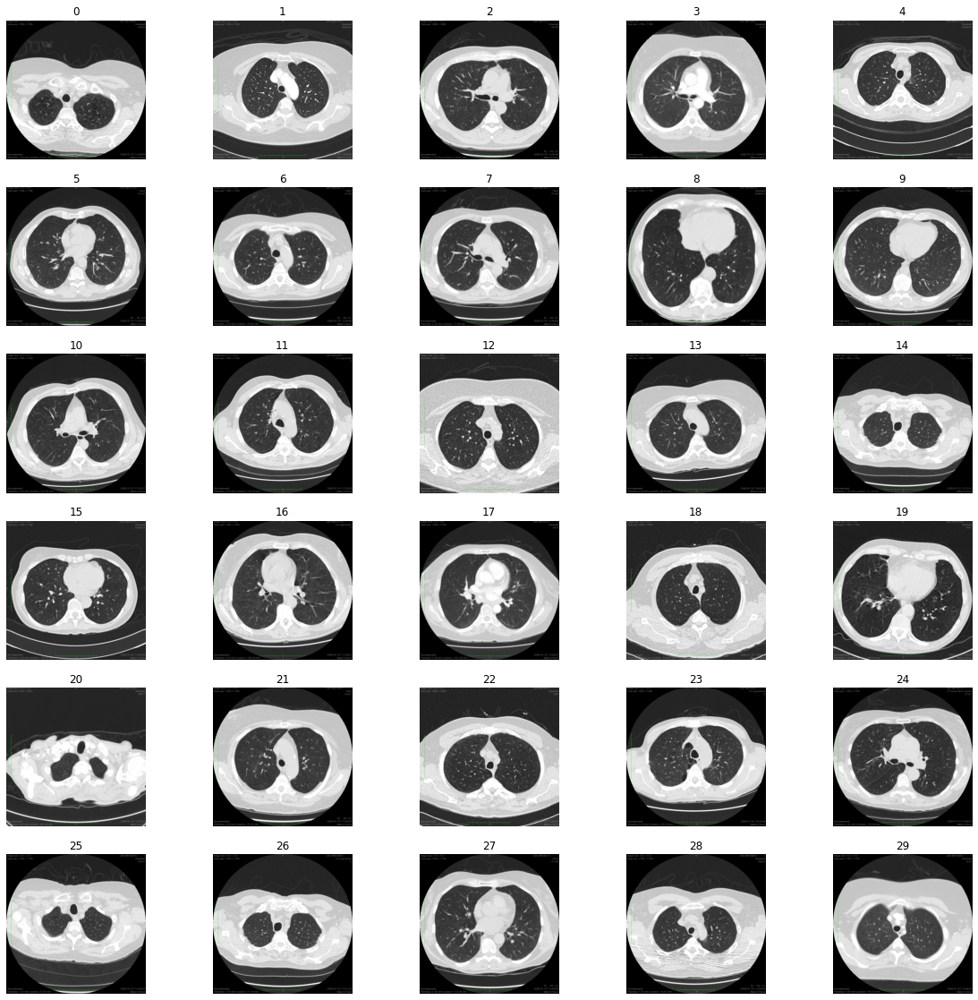

In [19]:
# 合成元に使えそうなct画像を選ぶ。。
# 表示枚数を決める
number = 30
ct_path = glob('drive/MyDrive/Lung_Nodule_2/Image_Processed/Not_Nodule/*')
num = len(ct_path)
ct_imgs = np.random.choice(ct_path, number,replace=False)

raw = 6 
col = 5
fig, ax = plt.subplots(raw, col, figsize=(20, 20))
for i in range(number):
  ax[i//col, i%col].imshow(Image.open(ct_imgs[i]))
  ax[i//col, i%col].set_title('{}'.format(i))
  ax[i//col, i%col].axis('off')

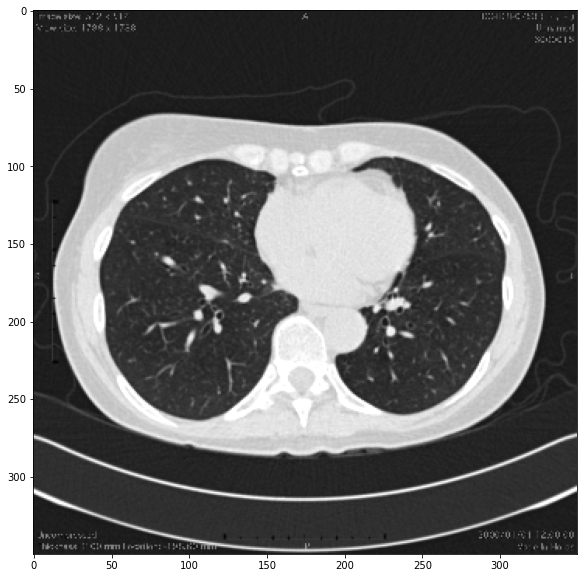

In [38]:
# 表示したいct画像のindexを指定。
idx = 15

ct_img = np.array(Image.open(ct_imgs[idx]))
ct_img = cv2.resize(ct_img, (350,350))[:,:,0]
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(ct_img, cmap='gray')

In [39]:
# 選んだ合成元ct画像を保存。
num = 0
Image.fromarray(ct_img).save('drive/MyDrive/GAN_Cancer/ct_img_{}.jpg'.format(num))

In [25]:
! pip install pyamg

In [46]:
# ポアソン合成。

import numpy as np
import scipy.sparse
import PIL.Image
import pyamg

fake_path = 'drive/MyDrive/GAN_Cancer/fake_img_{}.jpg'.format(1)
mask_path = 'drive/MyDrive/GAN_Cancer/mask_img_{}.jpg'.format(1)
ct_path = 'drive/MyDrive/GAN_Cancer/ct_img_{}.jpg'.format(0)
poisson_path = 'drive/MyDrive/GAN_Cancer/poisson_{}.jpg'.format(2)

# 上記画像から腫瘍を生成したい座標を決める。
offset = (200, 240)

# pre-process the mask array so that uint64 types from opencv.imread can be adapted
def prepare_mask(mask):
    if type(mask[0][0]) is np.ndarray:
        result = np.ndarray((mask.shape[0], mask.shape[1]), dtype=np.uint8)
        for i in range(mask.shape[0]):
            for j in range(mask.shape[1]):
                if sum(mask[i][j]) > 0:
                  
                    result[i][j] = 1
                else:
                    result[i][j] = 0
        mask = result
    return mask

def blend(img_target, img_source, img_mask, offset=(0, 0)):
    # compute regions to be blended
    region_source = (
            max(-offset[0], 0),
            max(-offset[1], 0),
            min(img_target.shape[0]-offset[0], img_source.shape[0]),
            min(img_target.shape[1]-offset[1], img_source.shape[1]))
    region_target = (
            max(offset[0], 0),
            max(offset[1], 0),
            min(img_target.shape[0], img_source.shape[0]+offset[0]),
            min(img_target.shape[1], img_source.shape[1]+offset[1]))
    region_size = (region_source[2]-region_source[0], region_source[3]-region_source[1])

    # clip and normalize mask image
    img_mask = img_mask[region_source[0]:region_source[2], region_source[1]:region_source[3]]
    print(img_mask.shape)
    img_mask = prepare_mask(img_mask)
    img_mask[img_mask==0] = False
    img_mask[img_mask!=False] = True

    # create coefficient matrix
    # np.prod()で全ての要素の積
    # identityで単位行列を作成。
    A = scipy.sparse.identity(np.prod(region_size), format='lil')
    for y in range(region_size[0]):
        for x in range(region_size[1]):
            if img_mask[y,x]:
                index = x+y*region_size[1]
                A[index, index] = 4
                if index+1 < np.prod(region_size):
                    A[index, index+1] = -1
                if index-1 >= 0:
                    A[index, index-1] = -1
                if index+region_size[1] < np.prod(region_size):
                    A[index, index+region_size[1]] = -1
                if index-region_size[1] >= 0:
                    A[index, index-region_size[1]] = -1
    # tocsr()で計算ができるようモードに変換。
    A = A.tocsr()
    
    # create poisson matrix for b
    P = pyamg.gallery.poisson(img_mask.shape)

    # for each layer (ex. RGB)
    # for num_layer in range(img_target.shape[2]):
      # get subimages
    t = img_target[region_target[0]:region_target[2],region_target[1]:region_target[3]]
    s = img_source[region_source[0]:region_source[2], region_source[1]:region_source[3]]
    t = t.flatten()
    s = s.flatten()

    # create b
    b = P * s
    for y in range(region_size[0]):
        for x in range(region_size[1]):
            if not img_mask[y,x]:
                index = x+y*region_size[1]
                b[index] = t[index]

    # solve Ax = b
    # 線型方程式を解いている
    x = pyamg.solve(A,b,verb=False,tol=1e-10)

    # assign x to target image
    x = np.reshape(x, region_size)
    x[x>255] = 255
    x[x<0] = 0
    x = np.array(x, img_target.dtype)
    print(region_target)
    img_target[region_target[0]:region_target[2],region_target[1]:region_target[3]] = x

    return img_target


def test(offset=None):
    img_mask = np.asarray(PIL.Image.open(mask_path))
    img_mask = img_mask.copy()
    img_mask.flags.writeable = True
    img_source = np.asarray(PIL.Image.open(fake_path))
    # img_source = np.stack([img_source,img_source,img_source],axis=-1)
    img_source = img_source.copy()
    img_source.flags.writeable = True
    img_target = np.asarray(PIL.Image.open(ct_path))
    # img_target = np.stack([img_target,img_target,img_target],axis=-1)
    # img_target = img_target.copy()[:,:,0]
    img_target = img_target.copy()

    img_target.flags.writeable = True
    img_ret = blend(img_target, img_source, img_mask, offset=offset)
    img_ret = PIL.Image.fromarray(np.uint8(img_ret))
    img_ret.save(poisson_path)


if __name__ == '__main__':
    test(offset)

(64, 64, 3)
(200, 240, 264, 304)


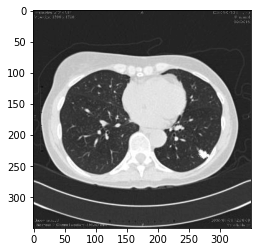

In [47]:
# ポアソン合成した画像を確認。
plt.imshow(Image.open(poisson_path), cmap='gray')

## ここから合成をよりリアルにしていく。

In [53]:
mask = np.array(Image.open(mask_path))
ct = np.array(Image.open(ct_path))
poisson_ct = np.array(Image.open(poisson_path))
mask.shape, ct.shape

((64, 64, 3), (350, 350))

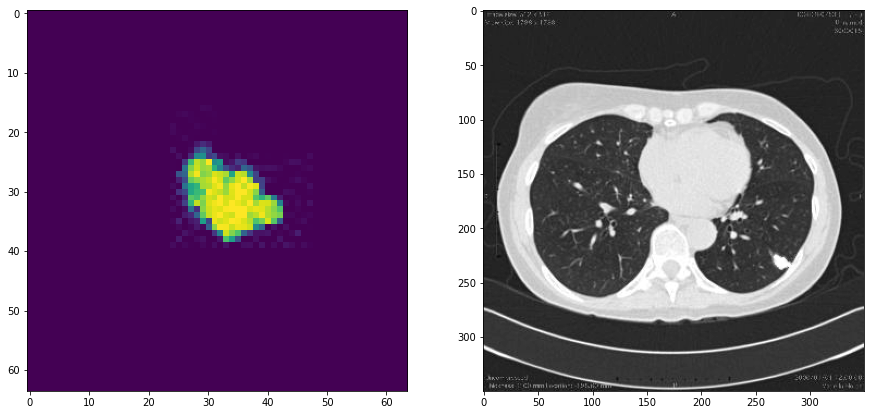

In [62]:
fig, ax = plt.subplots(1, 2, figsize=(15, 20))
ax[0].imshow(mask)
ax[1].imshow(poisson_ct, cmap='gray')

In [55]:
mask = mask[:, :, 0]
# ピクセル値が０以外の座標を取得。
a, b = np.where(mask != 0)
# 合成をした範囲。
cancer = poisson_ct[200:264, 240:302]

In [56]:
# 平滑化処理をして、合成感を目立たなくする。（各処理の回数は各々変更。）

# cancer_g = cv2.GaussianBlur(cancer, (3,3), 0)
# cancer_g = cv2.GaussianBlur(cancer, (3,3), 0)
cancer_g = cv2.GaussianBlur(cancer, (3,3), 0)
cancer_g = cv2.medianBlur(cancer, 3)
# cancer_g = cv2.medianBlur(cancer, 5)
# cancer_g = cv2.medianBlur(cancer, 5)

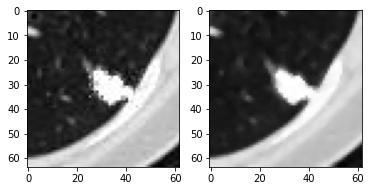

In [57]:
# ポアソン合成直後と平滑化処理後を比較。

fig, ax = plt.subplots(1, 2)
ax[0].imshow(cancer, cmap='gray')
ax[1].imshow(cancer_g, cmap='gray')

In [58]:
# 先ほど取得したピクセル値が０以外の座標を使って、平滑化処理をした画像のピクセル値と入れ替える。
for i in range(len(a)):
  cancer[a[i], b[i]] = cancer_g[a[i], b[i]]

# 一応ピクセル値が入れ替わっているか確認。
cancer[a[20], b[20]], cancer_g[a[20], b[20]]

(59, 59)

(-0.5, 349.5, 349.5, -0.5)

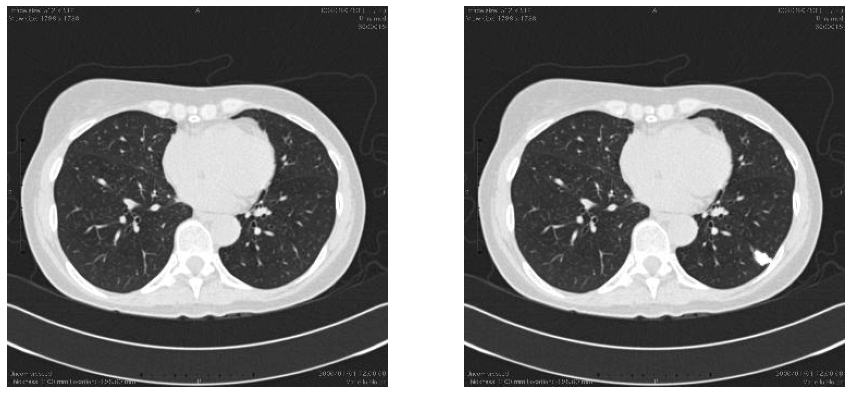

In [60]:
# 元の元のct画像に処理した部分を戻す。
# 比較する。（左：ポアソン合成直後、右：ポアソン合成後に局所的に平滑化処理）

poisson_ct[200:264, 240:302] = cancer
fig, ax = plt.subplots(1, 2, figsize=(15, 20))
ax[0].imshow(ct, cmap='gray')
ax[0].axis('off')
ax[1].imshow(poisson_ct, cmap='gray')
ax[1].axis('off')

In [ ]:
Image.fromarray(ct).save('drive/MyDrive/GAN_Cancer/poisson_smothing_0.jpg')